<a href="https://colab.research.google.com/github/zacharylazzara/COVID-19_Hotspot-Map/blob/main/PyTorch_UNet_Training_on_Correct_Resolution_v4.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Referenced Materials**

* https://amaarora.github.io/2020/09/13/unet.html
* https://towardsdatascience.com/unet-line-by-line-explanation-9b191c76baf5
* https://towardsdatascience.com/understanding-semantic-segmentation-with-unet-6be4f42d4b47
* https://www.youtube.com/watch?v=IHq1t7NxS8k

The majority of this comes from the referenced YouTube video

# Imports and Initialization

In [26]:
# Imports
!pip install segmentation-models-pytorch -q
!pip install -U albumentations -q

import sys
import os
import random
import torch
import torchvision
import torch.utils.data
import matplotlib.pyplot as plt
import matplotlib.ticker as plticker
import segmentation_models_pytorch as smp
import torch.optim as optim
import torch.nn as nn
import torchvision.transforms.functional as TF
import numpy as np
import albumentations as A
from albumentations.pytorch.transforms import ToTensorV2
from torch.utils.data import Dataset
from torch.utils.data import DataLoader
from PIL import Image
from tqdm import tqdm
from sklearn.model_selection import train_test_split
from mpl_toolkits.axes_grid1 import ImageGrid
import cv2
from google.colab.patches import cv2_imshow
from pathlib import Path
from glob import glob

In [27]:
# Initialize Environment
%env SRC_DIR       = sarpol-zahab-tents
%env DATA_DIR      = data/
%env TRAIN_IMG_DIR = data/train_images/
%env TRAIN_LBL_DIR = data/train_labels/
%env VAL_IMG_DIR   = data/val_images/
%env VAL_LBL_DIR   = data/val_labels/
%env PREDICT_DIR   = predictions/

SRC_DIR       = os.environ.get("SRC_DIR")
DATA_DIR      = os.environ.get("DATA_DIR")
TRAIN_IMG_DIR = os.environ.get("TRAIN_IMG_DIR")
TRAIN_LBL_DIR = os.environ.get("TRAIN_LBL_DIR")
VAL_IMG_DIR   = os.environ.get("VAL_IMG_DIR")
VAL_LBL_DIR   = os.environ.get("VAL_LBL_DIR")
PREDICT_DIR   = os.environ.get("PREDICT_DIR")

env: SRC_DIR=sarpol-zahab-tents
env: DATA_DIR=data/
env: TRAIN_IMG_DIR=data/train_images/
env: TRAIN_LBL_DIR=data/train_labels/
env: VAL_IMG_DIR=data/val_images/
env: VAL_LBL_DIR=data/val_labels/
env: PREDICT_DIR=predictions/


In [28]:
# Initialize Directories
%%bash
echo "Working in Directory: $(pwd)"

if [ -d 'sample_data' ]; then
  rm -r sample_data
fi

if [ ! -d $SRC_DIR ]; then
 git clone https://github.com/tofighi/sarpol-zahab-tents.git
fi

if [ ! -d $TRAIN_IMG_DIR ]; then
  mkdir -p $TRAIN_IMG_DIR
fi

if [ ! -d $TRAIN_LBL_DIR ]; then
  mkdir -p $TRAIN_LBL_DIR
fi

if [ ! -d $VAL_IMG_DIR ]; then
  mkdir -p $VAL_IMG_DIR
fi

if [ ! -d $VAL_LBL_DIR ]; then
  mkdir -p $VAL_LBL_DIR
fi

if [ ! -d $PREDICT_DIR ]; then
  mkdir -p $PREDICT_DIR
fi

Working in Directory: /content


Cloning into 'sarpol-zahab-tents'...


# Configuration

In [29]:
# Configuration
# Dataset
TEST_SIZE = 0.3
RANDOM_STATE = 123
ALLOW_IRRELEVANT = False # If images don't have tents do we want to throw them out or not?
SARPOL = True # do we want to download the very large Sarpol image?

# Display Limit
DISP_LIMIT    = 1 # Maximum number of images to display
DISP_RESULTS  = True
DISP_SCALE    = 2#150 # Amount to integer divide displayed figure scale by (set to 1 to disable); useful if the notebook keeps crashing

# Images
IMG_FORMAT    = "png"
BRIGHTNESS    = 0.5 # set to 1 for no dimming

# Checkpoints
CHECKPOINT    = "checkpoint.pt"

# Hyperparameters
LEARNING_RATE = 1e-4 # 1x10^-4 = 0.0001
DEVICE        = "cuda" if torch.cuda.is_available() else "cpu"
BATCH_SIZE    = 1#5 # Batch size defines the prediction batch; set to 1 if we want individual files
NUM_EPOCHS    = 50 #100
NUM_WORKERS   = 2
IMAGE_HEIGHT  = 512
IMAGE_WIDTH   = 512
PIN_MEMORY    = True
LOAD_MODEL    = True

# Convolution Settings
C_KERNEL      = 3     # This is the matrix that slides across the image (we define matrix size, so kernel = 3 means 3x3 matrix that slides across the image)
C_STRIDE      = 1     # Number of pixels the kernel slides over the input (how many pixels we move the filter at a time)
C_PADDING     = 1     # Sometimes the filter doesn't perfectly fit the input image, in which case we can pad with 0s or drop the part of the image that didn't fit (called valid padding)
C_BIAS        = False # Bias is false in this case because we're using BatchNorm2d (bias would be canceled by the batch norm, so we set it to false)
R_INPLACE     = True  #

# UNet Settings
IN_CHANNELS   = 3
OUT_CHANNELS  = 1 # We're doing binary image segmentation (because our masks are black and white), so we can output a single channel
U_FEATURES    = [64, 128, 256, 512] # Features come from the architecture (the number above the boxes)

# UNet Pool Settings
P_KERNEL      = 2
P_STRIDE      = 2

# Final layer kernel size
F_KERNEL      = 1 # Because we're outputting the final image here



# Accuracy; this is used to prevent division by zero, so we want a small value that doesn't have much impact on the results
EPSILON = sys.float_info.epsilon

In [30]:
def load(path):
  return np.array([np.asarray(Image.open(path)) for path in sorted(glob(path))])
  
MAP = None
if SARPOL:
  !gdown --id 1-YUbFjwFL2G5r8TudKS0XK56BjJ0KsTK
  MAP = load("sarpol.png")[0]
  print(f"Sarpol Shape: {MAP.shape}\n")

if LOAD_MODEL:
  !gdown --id 1ulHrgSyNwo1X2WYmQyeb4lIxIIJ4Xs-G

Downloading...
From: https://drive.google.com/uc?id=1-YUbFjwFL2G5r8TudKS0XK56BjJ0KsTK
To: /content/sarpol.png
100% 137M/137M [00:00<00:00, 166MB/s]
Sarpol Shape: (8192, 8192, 4)

Downloading...
From: https://drive.google.com/uc?id=1ulHrgSyNwo1X2WYmQyeb4lIxIIJ4Xs-G
To: /content/checkpoint.pt
100% 373M/373M [00:03<00:00, 109MB/s] 


# Preprocessing

In [31]:
# Preparing Data
src_imgs = load(f"{SRC_DIR}/data/images/*")
src_lbls = load(f"{SRC_DIR}/data/labels/*")

dataset = []
# Dataset Structure:
# [
#   0:{
#     img:  image
#     lbl:  label
#     filename: {img: 0.png, lbl: 0.png}
#   },
#   1:{}, 2:{}, n:{}
# ]

if src_imgs.shape[0] == src_lbls.shape[0]:
  n = src_lbls.shape[0]

  for index in range(n):
    dataset.append({
      "img":Image.fromarray(src_imgs[index]),
      "lbl":Image.fromarray(src_lbls[index]),
      "filename":{
        "img":f"{index}.{IMG_FORMAT}",
        "lbl":f"{index}.{IMG_FORMAT}"
      }
    })

def save_data(data, val=False):
  img_dir = TRAIN_IMG_DIR
  lbl_dir = TRAIN_LBL_DIR

  if val:
    img_dir = VAL_IMG_DIR
    lbl_dir = VAL_LBL_DIR

  data["img"].save(f"{img_dir}/{data['filename']['img']}")
  data["lbl"].save(f"{lbl_dir}/{data['filename']['lbl']}")

relevant = 0
irrelevant = 0
for data in dataset:
  if np.asarray(data["lbl"]).sum() > 0:
    relevant += 1
  else:
    irrelevant += 1

def percent(sample, total):
  return f"({sample}/{total}) = {((sample/total)*100):.2f}%"

total = len(dataset)
print(f"Dataset Size: {total}\nRelevant Percentage: {percent(relevant, total)}, Irrelevant Percentage: {percent(irrelevant, total)}")
print(f"Allow Irrelevant Data? {'YES' if ALLOW_IRRELEVANT else 'NO'}")

training_set, validation_set = train_test_split(dataset, test_size=TEST_SIZE, random_state=RANDOM_STATE)

training_data = 0
for training in training_set:
  if ALLOW_IRRELEVANT or np.asarray(training["lbl"]).sum() > 0:
    save_data(training, val=False)
    training_data += 1
    
validation_data = 0
for testing in validation_set:
  if ALLOW_IRRELEVANT or np.asarray(testing["lbl"]).sum() > 0:
    save_data(testing, val=True)
    validation_data += 1


total_usable = training_data + validation_data
print(f"\nTraining Percentage: {percent(training_data, total_usable)}, Validation Percent: {percent(validation_data, total_usable)}")



# TODO: need to generate augmented data too (or at least ensure augmented data expands the dataset and doesn't just replace it), and also re-train the model on the updated version

Dataset Size: 256
Relevant Percentage: (90/256) = 35.16%, Irrelevant Percentage: (166/256) = 64.84%
Allow Irrelevant Data? NO

Training Percentage: (64/90) = 71.11%, Validation Percent: (26/90) = 28.89%


In [32]:
# Cleanup
%%bash
if [ -d $SRC_DIR ]; then
  rm -r $SRC_DIR
fi

# UNet

**U-Net Architecture:**

The first half of the architecture is the down-sampling process. At each stage, two 3x3 convolutions are used. The output is then pooled and becomes the input for the next 3x3 convolution and so on, until the bottom of this diagram is reached.

The second half of the architecture is the up-sampling process, which is a reflection of the down-sampling process.

In [33]:
# UNet Model
# Adapted From https://www.youtube.com/watch?v=IHq1t7NxS8k
# Referenced https://medium.com/@RaghavPrabhu/understanding-of-convolutional-neural-network-cnn-deep-learning-99760835f148

class DoubleConv(nn.Module):
  def __init__(self, in_channels, out_channels):
    super(DoubleConv, self).__init__()
    self.conv = nn.Sequential (
        nn.Conv2d(in_channels, out_channels, C_KERNEL, C_STRIDE, C_PADDING, bias=C_BIAS), # This is a same convolution (input height*width = output height*width)
        nn.BatchNorm2d(out_channels), # BatchNorm accelerates training by normalizing inputs by re-centering and re-scaling
        nn.ReLU(inplace=R_INPLACE), # ReLU is Rectified Linear Unit; essentially it makes it so negative inputs are discarded and positive inputs are passed through

        # Now we do this a second time but with out_channels to out_channels
        nn.Conv2d(out_channels, out_channels, C_KERNEL, C_STRIDE, C_PADDING, bias=C_BIAS),
        nn.BatchNorm2d(out_channels),
        nn.ReLU(inplace=R_INPLACE),
    )

  def forward(self, x):
    return self.conv(x)

# DoubleConv is everything in the first node of the architecture (before pooling)

class UNet(nn.Module):
  def __init__(self, in_channels=3, out_channels=1, features=U_FEATURES):
    super(UNet, self).__init__()
    self.ups = nn.ModuleList()
    self.downs = nn.ModuleList() # Stores the convolutional layers; it's a list, but using ModuleList lets us use BatchNorm2d
    self.pool = nn.MaxPool2d(kernel_size=P_KERNEL, stride=P_STRIDE) # Pooling layer will be used inbetween, in forwarding method
    # Note that the pooling layer will require out inputs to be perfectly divisible by 2 because we're doing a stride of 2
    # Example: 161 x 161 -> MaxPool -> 80 x 80 -> Upsample -> 160 x 160; in this case, we couldn't concatinate the two as they need the same width and height for concat (161x161 is input, 160x160 is output)
    # If input is perfectly dividible by 16 then this issue won't happen (16 because its 4 steps, all dividing by 2 (16/(4*2) = 2))
    # In order to keep the system general, we can either pad the image or crop the image so that it works even if image size isn't perfectly divisible by 16


    # Down-Sampling part of UNet
    for feature in features:
      self.downs.append(DoubleConv(in_channels, feature)) # Mapping some input (in the UNet architecture example, it maps 1 to 64 for the first node)
      in_channels = feature

    # Up-Sampling Part of UNet
    # At 10:20 or so in the video he mentions transposed convoltions that may be a better method to this part, but we'll use similar approach to UNet paper for now
    # We're using the reversed list of features because we're going from the bottom up now
    for feature in reversed(features):
      
      # In_channels is feature*2 here, output is feature
      self.ups.append(
          nn.ConvTranspose2d( 
              feature*2, feature, kernel_size=P_KERNEL, stride=P_STRIDE
          )
      )
      self.ups.append(DoubleConv(feature*2, feature)) # Because we go up then do two convs then go up then do two convs etc

    # Bottom Layer
    self.bottleneck = DoubleConv(features[-1], features[-1]*2) # We're using features[-1] because we want the bottom feature

    # Now we do 1x1 conv which doesn't change height or width just number of channels
    self.final_conv = nn.Conv2d(features[0], out_channels, kernel_size=F_KERNEL)
  

  def forward(self, x):
    skip_connections = [] # We skip connections for each stage in the architecture, as we use this part later on
    
    # This loop does all the down-sampling steps until the final step just before the bottom layer (aka bottleneck)
    for down in self.downs:
      x = down(x)
      skip_connections.append(x)
      x = self.pool(x)

    x = self.bottleneck(x)
    skip_connections = skip_connections[::-1] # we wanna go backwards in order when we're doing our concatination; the highest resolution image is the first one; to make things easier, we'll just reverse this list

    # We're using a step of 2 here because we're going up then double conv each iteration
    for i in range(0, len(self.ups), 2):
      x = self.ups[i](x) # doing ConvTranspose2d here
      skip_connection = skip_connections[i//2] # // is integer division; we're doing a step of one ordering here

      # Dealing with images that are not perfectly dividible
      # TODO: perhaps we should look into scaling instead of cropping or padding, or perhaps we should scale before we put the image into the system, so that this is not relevant?
      if x.shape != skip_connection.shape:
        x = TF.resize(x, size=skip_connections.shape[2:]) # we're taking out height and width here; basically, we're resizing the image if it doesn't fit

      concat_skip = torch.cat((skip_connection, x), dim=1) # dim 1 is the channel dimension; we're concationating these things along the channel dimension
      x = self.ups[i+1](concat_skip) # running it through a double conv
    
    return self.final_conv(x)




# Testing the implementation thus far
def test():
  x = torch.randn((3, 1, 160, 160)) # 3 is number of images (batch size), 1 is number of channels, 160 is image height, 160 is image width
  model = UNet(in_channels=1, out_channels=1)
  preds = model(x)
  print(preds.shape)
  print(x.shape)
  assert preds.shape == x.shape

if __name__ == "__main__":
   test()

torch.Size([3, 1, 160, 160])
torch.Size([3, 1, 160, 160])


# Tent Counter

In [34]:
# We can probably improve UNets results by knowing the number of tents even. Maybe UNet would figure out the relationship between number of tents and number of labels







# Dataset

In [35]:
# TentDataset
# Adapted From https://www.youtube.com/watch?v=IHq1t7NxS8k

# Data directory should be in the format:
# data
#   train_images
#   train_masks
#   val_images
#   val_masks

class TentDataset(Dataset):
  def __init__(self, image_dir=TRAIN_IMG_DIR, mask_dir=TRAIN_LBL_DIR, transform=None):
    self.image_dir = image_dir
    self.mask_dir = mask_dir
    self.transform = transform
    self.images = os.listdir(image_dir)

  def __len__(self):
    return len(self.images)

  def __getitem__(self, index):
    image_path = os.path.join(self.image_dir, self.images[index])
    mask_path = os.path.join(self.mask_dir, self.images[index])
    image = np.array(Image.open(image_path).convert("RGB"))
    mask = np.array(Image.open(mask_path).convert("L"), dtype=np.float32) # We use L since mask is grey scale
    mask[mask == 255.0] = 1.0 # Preprocessing; we change this cuz we're using a sigmoid on the last activation for probability of white pixel, so this makes it work better?

    if self.transform is not None:
      augmentations = self.transform(image=image, mask=mask)
      image = augmentations["image"]
      mask = augmentations["mask"]

    return image, mask

# Utilities

In [36]:
# Utilities
# Adapted From https://www.youtube.com/watch?v=IHq1t7NxS8k

def visualize(image_data):
  print("Displaying results. Please wait, this may take some time...")
  for resolution in image_data: # This will only run once, since we only use one resolution
    cols = 3
    rows = len(image_data[resolution])

    fig = plt.figure(figsize=(resolution[0]//DISP_SCALE, resolution[1]//DISP_SCALE)) # The figure needs to be big enough to accomodate all the images; maybe we need to get resolution elsewhere?
    grid = ImageGrid(fig, 111, nrows_ncols=(rows, cols), axes_pad=0.5)

    g_index = -1

    for record in image_data[resolution]:
      img = record["img"]
      # lbl = cv2.convertScaleAbs(cv2.cvtColor(record["lbl"], cv2.COLOR_BGR2GRAY))
      # prd = cv2.convertScaleAbs(cv2.cvtColor(record["prd"], cv2.COLOR_BGR2GRAY))

      lbl = cv2.threshold(cv2.convertScaleAbs(cv2.cvtColor(record["lbl"], cv2.COLOR_BGR2GRAY)), 1, 255, cv2.THRESH_BINARY)[1]
      prd = cv2.convertScaleAbs(cv2.cvtColor(record["prd"], cv2.COLOR_BGR2GRAY))
      #prd = cv2.threshold(cv2.convertScaleAbs(cv2.cvtColor(record["prd"], cv2.COLOR_BGR2GRAY)), 1, 255, cv2.THRESH_BINARY)[1]
      
      params = cv2.SimpleBlobDetector_Params()
      params.minArea = 1;
      params.maxArea = IMAGE_HEIGHT * IMAGE_WIDTH;
      params.minDistBetweenBlobs = 0
      params.filterByColor = True
      params.filterByArea = True
      params.filterByCircularity = False
      params.filterByInertia = False
      params.filterByConvexity = False
      params.minThreshold = 0
      params.maxThreshold = 255
      params.blobColor = 255

      detector = cv2.SimpleBlobDetector_create(params)
      detector.empty()

      # lbl = cv2.erode(lbl, np.ones((3,3), np.uint8), iterations=1)
      lbl_keypoints = detector.detect(lbl)

      # prd = cv2.erode(prd, np.ones((3,3), np.uint8), iterations=1)
      prd_keypoints = detector.detect(prd)

      lbl_points = []
      prd_points = []

      for point in lbl_keypoints:
        lbl_points.append(np.array([point.pt[0], point.pt[1]]))

      for point in prd_keypoints:
        prd_points.append(np.array([point.pt[0], point.pt[1]]))

      lbl_points = np.array(lbl_points)
      prd_points = np.array(prd_points)

      g_index += 1
      grid[g_index].set_title(f"Ground Truth (Tents: {len(lbl_points)})")
      grid[g_index].imshow(np.dot(img, BRIGHTNESS), vmin=0, vmax=1)
      if lbl_points.size:
        grid[g_index].scatter(lbl_points[:,0], lbl_points[:,1], s=50, marker='x', c="red", alpha=1)

      

      highlight = np.dot(img.copy(), BRIGHTNESS)

      # Adapted from: https://stackoverflow.com/questions/46103731/is-there-a-simple-method-to-highlight-the-mask
      contours, hierarchy = cv2.findContours(prd, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
      cv2.drawContours(highlight, contours, -1, (255, 0, 0))
      # b,g,r = cv2.split(highlight)
      # r = cv2.add(b,30,dst=b, mask=prd, dtype=cv2.CV_8U)
      # cv2.merge((b,g,r), highlight)


      g_index += 1
      grid[g_index].set_title(f"Prediction (Tents: {len(prd_points)})")
      grid[g_index].imshow(highlight.astype(np.uint8), vmin=0, vmax=1)
      if prd_points.size:
        grid[g_index].scatter(prd_points[:,0], prd_points[:,1], s=50, marker='x', c="red", alpha=1)

      accuracy = record["accuracy"][0]
      g_index += 1
      grid[g_index].set_title(f"Predicted Mask (Accuracy: {accuracy:.2f})")
      grid[g_index].imshow(prd, vmin=0, vmax=1)
    plt.show()

def save_checkpoint(state, filename=CHECKPOINT):
  print("=> Saving checkpoint\n")
  torch.save(state, filename)

def load_checkpoint(checkpoint, model):
  print("=> Loading checkpoint\n")
  model.load_state_dict(checkpoint["state_dict"])

def get_loaders(train_dir, train_maskdir, val_dir, val_maskdir, batch_size, train_transform, val_transform, num_workers=4, pin_memory=True):
  train_ds = TentDataset(image_dir=train_dir, mask_dir=train_maskdir, transform=train_transform)
  train_loader = DataLoader(train_ds, batch_size=batch_size, num_workers=num_workers, pin_memory=pin_memory, shuffle=True)
  val_ds = TentDataset(image_dir=val_dir, mask_dir=val_maskdir, transform=val_transform)
  val_loader = DataLoader(val_ds, batch_size=batch_size, num_workers=num_workers, pin_memory=pin_memory, shuffle=False)
  return train_loader, val_loader

# if we'd have more classes this check accuracy would need to change
def check_accuracy(loader, model, device=DEVICE):
  # Worst metric
  avg_pixel_accuracy = 0
  
  # Better metrics
  avg_dice_score = 0
  avg_similarity = 0 # Gives us worst case score

  model.eval()

  image_data = {}
  image_data[(IMAGE_WIDTH, IMAGE_HEIGHT)] = []

  t_imgs = []
  t_lbls = []
  p_lbls = []
  accuracies = []

  with torch.no_grad():
    for x, y in loader:
      x = x.to(device)
      y = y.to(device).unsqueeze(1) # label doesn't have a channel cuz its' greyscale so we have to do this so accuracy works properly
      preds = torch.sigmoid(model(x))
      preds = (preds > 0.5).float()

      pixel_accuracy = (preds == y).sum() / torch.numel(preds)
      avg_pixel_accuracy += pixel_accuracy
      #print(f"Pixel Accuracy: {pixel_accuracy}")
      # For both of these metrics we add 1e-8 to the denominator to avoid possible division by 0 (1e-8 is a very small number that won't impact the results much).
      # These metrics should have a score between 0 and 1.


      # TODO: display accuracy within this loop, as this loop runs for each image in the training set

      # Jaccard Similarity Coefficient (aka Jaccard Index)
      jaccard_index = (EPSILON+(preds * y).sum()) / (EPSILON+(preds + y).sum()) # TODO: make sure we're summing this properly; I feel like at this stage preds and y are scalar values, in which case sum doesn't make sense? Though they might be pixel vectors here.
      avg_similarity += jaccard_index
      #print(f"Jaccard Similarity: {jaccard_index}")

      # Dice Score (aka F1-Score)
      dice_score = (2 * (preds * y).sum()) / ((preds + y).sum() + 1e-8)
      avg_dice_score += dice_score
      #print(f"Dice Score: {dice_score}")



      img = x.squeeze().permute(1, 2, 0).detach().cpu().numpy()
      lbl = np.stack((y.squeeze().permute(0, 1).detach().cpu().numpy(), )*3, axis=-1)
      prd = np.stack((preds.squeeze().permute(0, 1).detach().cpu().numpy(), )*3, axis=-1)

      j_index = jaccard_index.detach().cpu().numpy()
      d_score = dice_score.detach().cpu().numpy()
      p_accuracy = pixel_accuracy.detach().cpu().numpy()

      image_data[(img.shape[0], img.shape[1])].append({"img":img, "lbl":lbl, "prd":prd, "accuracy":(j_index, d_score, p_accuracy)}) # TODO: add tent count to this as well (both predicted and ground truth)

      #image_data.append({"img":img, "lbl":lbl, "prd":prd, "accuracy":(j_index, d_score, p_accuracy)})

      

      # t_imgs.append(img)
      # t_lbls.append(lbl)
      # p_lbls.append(prd)
      # accuracies.append((jaccard_index, dice_score, pixel_accuracy)) # TODO: send this to the visualizer so we can list accuracy; OR, use a dictionary to send to the visualizer instead with everything which might be best

  # Display
  visualize(image_data)

  model.train()

def save_predictions_as_imgs(loader, model, folder=PREDICT_DIR, device=DEVICE):
  model.eval()
  for idx, (x, y) in enumerate(loader):
    x = x.to(device=device)
    with torch.no_grad():
      preds = torch.sigmoid(model(x))
      preds = (preds > 0.5).float()
    torchvision.utils.save_image(preds, f"{folder}/pred_{idx}.{IMG_FORMAT}")
    torchvision.utils.save_image(y.unsqueeze(1), f"{folder}{idx}.{IMG_FORMAT}")
  
  model.train()

# Training

=> Loading checkpoint

Displaying results. Please wait, this may take some time...


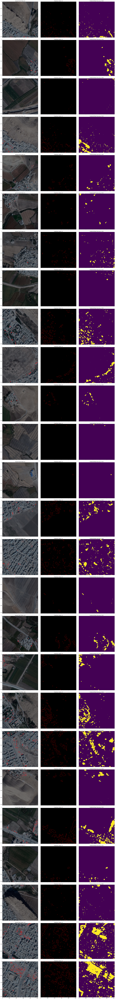

/usr/local/lib/python3.7/dist-packages/torch/cuda/amp/grad_scaler.py:115: UserWarning: torch.cuda.amp.GradScaler is enabled, but CUDA is not available.  Disabling.
  warnings.warn("torch.cuda.amp.GradScaler is enabled, but CUDA is not available.  Disabling.")
  0%|          | 0/64 [00:00<?, ?it/s]/usr/local/lib/python3.7/dist-packages/torch/autocast_mode.py:141: UserWarning: User provided device_type of 'cuda', but CUDA is not available. Disabling
  warnings.warn('User provided device_type of \'cuda\', but CUDA is not available. Disabling')
  5%|▍         | 3/64 [01:12<24:10, 23.77s/it, loss=-24.3]

In [ ]:
# Model Training
# Adapted From https://www.youtube.com/watch?v=IHq1t7NxS8k



# This whole function trains one epoch
def train_fn(loader, model, optimizer, loss_fn, scaler):
  loop = tqdm(loader) # tqdm gives us a progress bar

  for batch_idx, (data, targets) in enumerate(loop):
    data = data.to(device=DEVICE)
    targets = targets.float().unsqueeze(1).to(device=DEVICE) #might not need to make it float since it might already be float? Also, unsqueeze is used cuz we're adding a channel

    # Forward
    with torch.cuda.amp.autocast():
      predictions = model(data)
      loss = loss_fn(predictions, targets)

    # Backward
    optimizer.zero_grad()
    scaler.scale(loss).backward()
    scaler.step(optimizer)
    scaler.update()

    # Update tqdm loop
    loop.set_postfix(loss=loss.item())

def main():
  train_transform = A.Compose([
    A.Resize(height=IMAGE_HEIGHT, width=IMAGE_WIDTH),
    A.Rotate(limit=35, p=1.0),
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.1),
    A.Normalize(
      mean=[0.0, 0.0, 0.0],
      std=[1.0, 1.0, 1.0],
      max_pixel_value=255.0 # This basically just divides by 255, so we get a value between 0 and 1
    ),
    ToTensorV2()
  ])

  val_transforms = A.Compose([
    A.Resize(height=IMAGE_HEIGHT, width=IMAGE_WIDTH),
    A.Normalize(
      mean=[0.0, 0.0, 0.0],
      std=[1.0, 1.0, 1.0],
      max_pixel_value=255.0 # This basically just divides by 255, so we get a value between 0 and 1
    ),
    ToTensorV2()
  ])

  model = UNet(in_channels=3, out_channels=1).to(DEVICE) # if we wanted multiclass segmentation we'd change our channels and change our loss function to cross entropy loss
  loss_fn = nn.BCEWithLogitsLoss() # We're not doing sigmoid on the output of model which is why we're using this here
  optimizer = optim.Adam(model.parameters(), lr=LEARNING_RATE)

  train_loader, val_loader = get_loaders(
      TRAIN_IMG_DIR,
      TRAIN_LBL_DIR,
      VAL_IMG_DIR,
      VAL_LBL_DIR,
      BATCH_SIZE,
      train_transform,
      val_transforms,
      NUM_WORKERS,
      PIN_MEMORY
  )

  if LOAD_MODEL:
    if DEVICE == "cuda":
      load_checkpoint(torch.load(CHECKPOINT), model)
    else:
      load_checkpoint(torch.load(CHECKPOINT, map_location=lambda storage, loc: storage), model) # From https://discuss.pytorch.org/t/on-a-cpu-device-how-to-load-checkpoint-saved-on-gpu-device/349/4
  check_accuracy(val_loader, model, device=DEVICE) # Because the val_loader is being passed, we know that we're only visualizing validation images and not the images the model was trained on
  scaler = torch.cuda.amp.GradScaler()
  
  for epoch in range(NUM_EPOCHS):
    train_fn(train_loader, model, optimizer, loss_fn, scaler)

    # Save Model
    checkpoint = {"state_dict":model.state_dict(), "optimizer":optimizer.state_dict()}
    save_checkpoint(checkpoint)

    # Check Accuracy
    check_accuracy(val_loader, model, device=DEVICE)

    # Save Predictions
    save_predictions_as_imgs(val_loader, model, folder=PREDICT_DIR, device=DEVICE)

    
  


# This solves issues when running on Windows (issues relating to NUM_WORKERS); probably not so relevant to Colab.
if __name__ == "__main__":
  main()